In [22]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly as pt
%matplotlib inline
sns.set(color_codes=True)
import pymongo
import csv

In [23]:
client=pymongo.MongoClient("mongodb://localhost:27017/")

In [24]:
db=client.Internship
collection=db.Adult

In [25]:
cursor=collection.find()

In [26]:
#for doc in cursor:
  # data=doc


In [27]:
#df=data.to_csv('income.csv')

Read the data

In [28]:
data=pd.read_csv('D:/Inuron/Internships/adult_income/notebooks/income.csv')

In [29]:
data.isna().sum()

Unnamed: 0.1      0
Unnamed: 0        0
age               0
workclass         0
fnlwgt            0
education         0
education-num     0
marital-status    0
occupation        0
relationship      0
race              0
sex               0
capital-gain      0
capital-loss      0
hours-per-week    0
country           0
salary            0
dtype: int64

Understanding  the Data

In [30]:
data.head()

,Unnamed: 0.1,Unnamed: 0,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,country,salary
0,0,0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,1,1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,2,2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,3,3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,4,4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


* The data set consisits of 16 columns and then Unnamed,fnwgt are not important 

In [31]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Unnamed: 0.1    32561 non-null  int64 
 1   Unnamed: 0      32561 non-null  int64 
 2   age             32561 non-null  int64 
 3   workclass       32561 non-null  object
 4   fnlwgt          32561 non-null  int64 
 5   education       32561 non-null  object
 6   education-num   32561 non-null  int64 
 7   marital-status  32561 non-null  object
 8   occupation      32561 non-null  object
 9   relationship    32561 non-null  object
 10  race            32561 non-null  object
 11  sex             32561 non-null  object
 12  capital-gain    32561 non-null  int64 
 13  capital-loss    32561 non-null  int64 
 14  hours-per-week  32561 non-null  int64 
 15  country         32561 non-null  object
 16  salary          32561 non-null  object
dtypes: int64(8), object(9)
memory usage: 4.2+ MB


In [32]:
data.shape

(32561, 17)

32561 Rows 17 columns

In [33]:
data.describe()

,Unnamed: 0.1,Unnamed: 0,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week
count,32561.000000,32561.000000,32561.000000,3.256100e+04,32561.000000,32561.000000,32561.000000,32561.000000
mean,16280.000000,16280.000000,38.581647,1.897784e+05,10.080679,1077.648844,87.303830,40.437456
std,9399.695394,9399.695394,13.640433,1.055500e+05,2.572720,7385.292085,402.960219,12.347429
min,0.000000,0.000000,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,8140.000000,8140.000000,28.000000,1.178270e+05,9.000000,0.000000,0.000000,40.000000
50%,16280.000000,16280.000000,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000
75%,24420.000000,24420.000000,48.000000,2.370510e+05,12.000000,0.000000,0.000000,45.000000
max,32560.000000,32560.000000,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


In [34]:
data.isnull().sum()

Unnamed: 0.1      0
Unnamed: 0        0
age               0
workclass         0
fnlwgt            0
education         0
education-num     0
marital-status    0
occupation        0
relationship      0
race              0
sex               0
capital-gain      0
capital-loss      0
hours-per-week    0
country           0
salary            0
dtype: int64

No Null values

In [35]:
data.nunique()

Unnamed: 0.1      32561
Unnamed: 0        32561
age                  73
workclass             9
fnlwgt            21648
education            16
education-num        16
marital-status        7
occupation           15
relationship          6
race                  5
sex                   2
capital-gain        119
capital-loss         92
hours-per-week       94
country              42
salary                2
dtype: int64

## Data Cleaning

In [36]:
data=data.drop(labels=['Unnamed: 0.1', 'Unnamed: 0','education'],axis=1)

In [37]:
data.columns=data.columns.str.strip()

In [38]:
data=data.apply(lambda x: x.str.strip() if x.dtype =='object' else x)

In [39]:
categorical_columns=data.columns[data.dtypes=='object']
numerical_columns=data.columns[data.dtypes!='object']
print("Numerical Column:",numerical_columns)
print('categorical Columns:',categorical_columns)

Numerical Column: Index(['age', 'fnlwgt', 'education-num', 'capital-gain', 'capital-loss',
       'hours-per-week'],
      dtype='object')
categorical Columns: Index(['workclass', 'marital-status', 'occupation', 'relationship', 'race',
       'sex', 'country', 'salary'],
      dtype='object')


In [40]:
data['country'].unique()

array(['United-States', 'Cuba', 'Jamaica', 'India', '?', 'Mexico',
       'South', 'Puerto-Rico', 'Honduras', 'England', 'Canada', 'Germany',
       'Iran', 'Philippines', 'Italy', 'Poland', 'Columbia', 'Cambodia',
       'Thailand', 'Ecuador', 'Laos', 'Taiwan', 'Haiti', 'Portugal',
       'Dominican-Republic', 'El-Salvador', 'France', 'Guatemala',
       'China', 'Japan', 'Yugoslavia', 'Peru',
       'Outlying-US(Guam-USVI-etc)', 'Scotland', 'Trinadad&Tobago',
       'Greece', 'Nicaragua', 'Vietnam', 'Hong', 'Ireland', 'Hungary',
       'Holand-Netherlands'], dtype=object)

In [41]:
mode=data['workclass'].mode().values[0]
mode1=data['country'].mode().values[0]

In [42]:
data['workclass']=data['workclass'].replace('?',mode)
data['country']=data['country'].replace('?',mode1)

In [43]:
#data['workclass'].fillna(data['workclass'].mode(),inplace=True)

In [44]:
data['workclass'].unique()

array(['State-gov', 'Self-emp-not-inc', 'Private', 'Federal-gov',
       'Local-gov', 'Self-emp-inc', 'Without-pay', 'Never-worked'],
      dtype=object)

In [45]:
data.drop_duplicates(inplace=True)

In [46]:
data.isnull().sum()

age               0
workclass         0
fnlwgt            0
education-num     0
marital-status    0
occupation        0
relationship      0
race              0
sex               0
capital-gain      0
capital-loss      0
hours-per-week    0
country           0
salary            0
dtype: int64

## Descriptive Statistics

In [47]:
data[numerical_columns].describe()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week
count,32537.000000,3.253700e+04,32537.000000,32537.000000,32537.000000,32537.000000
mean,38.585549,1.897808e+05,10.081815,1078.443741,87.368227,40.440329
std,13.637984,1.055565e+05,2.571633,7387.957424,403.101833,12.346889
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178270e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.369930e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


std of age,capital_gain,capital_loss,hours_per week is high so we need to remove outliers

In [48]:
data[categorical_columns].describe()

,workclass,marital-status,occupation,relationship,race,sex,country,salary
count,32537,32537,32537,32537,32537,32537,32537,32537
unique,8,7,15,6,5,2,41,2
top,Private,Married-civ-spouse,Prof-specialty,Husband,White,Male,United-States,<=50K
freq,24509,14970,4136,13187,27795,21775,29735,24698


We have more unique values so we need to encode that Hashing encoder will be great reduce dimensionality for the algorithm 



## Data Visualization

To represent the distributions of data Histogram is used

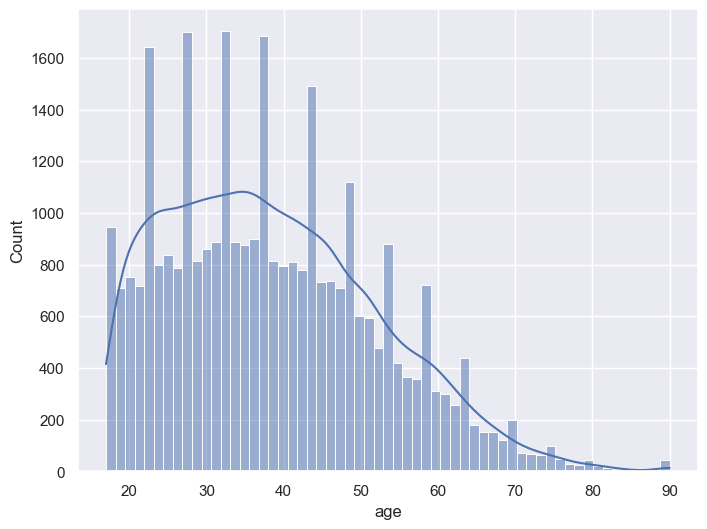

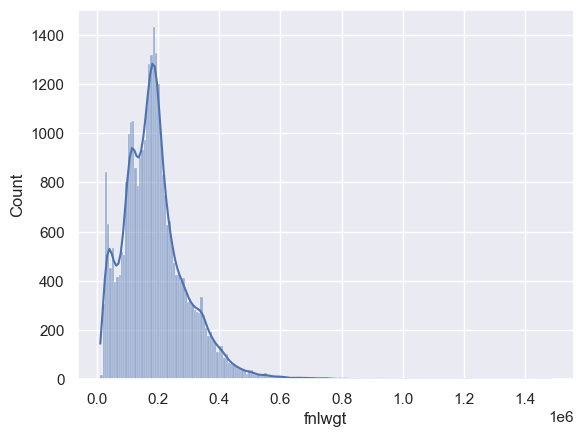

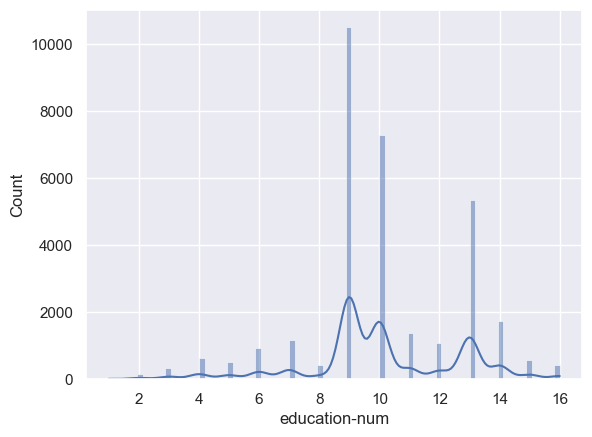

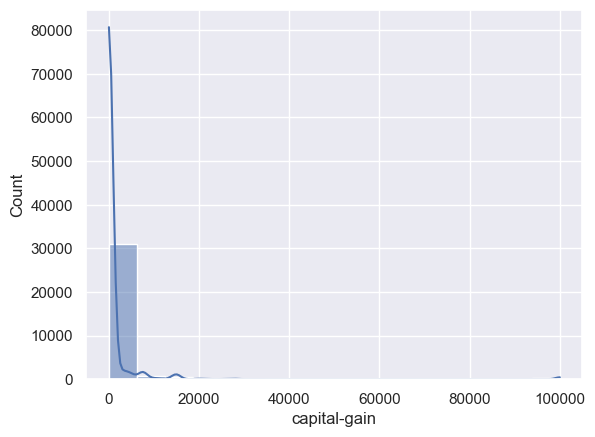

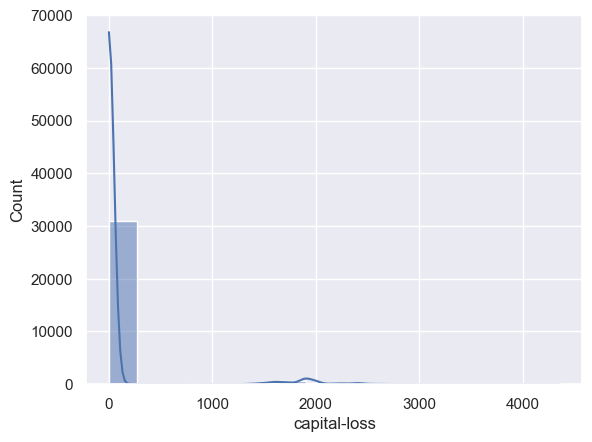

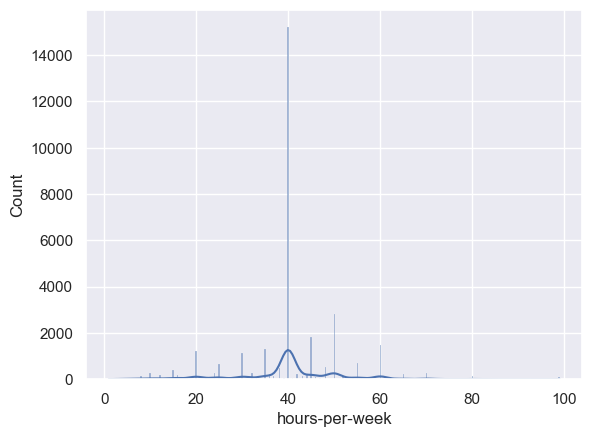

In [49]:
plt.figure(figsize=(8,6))
x=0
for i in numerical_columns:
    sns.histplot(data=data,x=i,kde=True)
    print('\n')
    plt.show()

I) Age:
    
     shape: Skewed - left skewed -ve skew
     Central Tendency: 
                   Mean=38
     spread:
         min-17
         max-90
                

II)fnlwgt:
       
       shape: Bimodal - Multiple peaks
     Central Tendency: 
                  Mean=1.89
     spread:
         min-1.22
         max-1.49
      



In [50]:
import plotly.express as px
x=0
for i in categorical_columns:
    fig=px.bar(data,x=i,y=data['salary'],color='salary')
    fig.update_layout(
        plot_bgcolor='rgba(10,0,10,0)'
    )
    fig.show()
    

We have a unequal dataset.


In [51]:
categorical_columns

Index(['workclass', 'marital-status', 'occupation', 'relationship', 'race',
       'sex', 'country', 'salary'],
      dtype='object')

In [52]:
data['workclass'].unique()

array(['State-gov', 'Self-emp-not-inc', 'Private', 'Federal-gov',
       'Local-gov', 'Self-emp-inc', 'Without-pay', 'Never-worked'],
      dtype=object)

In [53]:
data[categorical_columns].head()

,workclass,marital-status,occupation,relationship,race,sex,country,salary
0,State-gov,Never-married,Adm-clerical,Not-in-family,White,Male,United-States,<=50K
1,Self-emp-not-inc,Married-civ-spouse,Exec-managerial,Husband,White,Male,United-States,<=50K
2,Private,Divorced,Handlers-cleaners,Not-in-family,White,Male,United-States,<=50K
3,Private,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,United-States,<=50K
4,Private,Married-civ-spouse,Prof-specialty,Wife,Black,Female,Cuba,<=50K


In [54]:
data['salary'].unique()


array(['<=50K', '>50K'], dtype=object)

In [55]:
data['salary']=data['salary'].replace({'<=50K':0,'>50K':1})

In [56]:
for col in data[categorical_columns].drop('salary',axis=1).columns:
    x=data[col].head(1)
    data= pd.get_dummies(data, columns=[col], prefix = [col], drop_first=True)


In [57]:
data.head()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,salary,workclass_Local-gov,workclass_Never-worked,workclass_Private,...,country_Portugal,country_Puerto-Rico,country_Scotland,country_South,country_Taiwan,country_Thailand,country_Trinadad&Tobago,country_United-States,country_Vietnam,country_Yugoslavia
0,39,77516,13,2174,0,40,0,False,False,False,...,False,False,False,False,False,False,False,True,False,False
1,50,83311,13,0,0,13,0,False,False,False,...,False,False,False,False,False,False,False,True,False,False
2,38,215646,9,0,0,40,0,False,False,True,...,False,False,False,False,False,False,False,True,False,False
3,53,234721,7,0,0,40,0,False,False,True,...,False,False,False,False,False,False,False,True,False,False
4,28,338409,13,0,0,40,0,False,False,True,...,False,False,False,False,False,False,False,False,False,False


In [58]:
data=data.replace({True:1,False:0})

In [59]:
data.head()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,salary,workclass_Local-gov,workclass_Never-worked,workclass_Private,...,country_Portugal,country_Puerto-Rico,country_Scotland,country_South,country_Taiwan,country_Thailand,country_Trinadad&Tobago,country_United-States,country_Vietnam,country_Yugoslavia
0,39,77516,13,2174,0,40,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,50,83311,13,0,0,13,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2,38,215646,9,0,0,40,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
3,53,234721,7,0,0,40,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
4,28,338409,13,0,0,40,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


## Handling Imbalace

In [60]:
x=data.drop('salary',axis=1)
y=data['salary']

In [61]:
from imblearn.over_sampling import RandomOverSampler
random_sampling=RandomOverSampler()
x_sampled,y_sampled=random_sampling.fit_resample(x,y)

(array([24698.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0., 24698.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

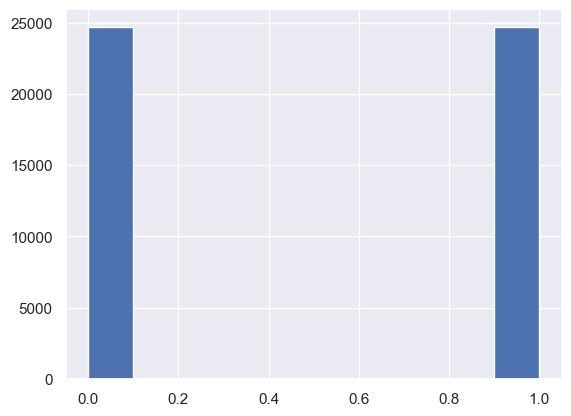

In [62]:
plt.hist(y_sampled)